In [1]:
# Importando os módulos:
import pandas as pd
import folium
from folium import plugins, Map
import matplotlib.pyplot as plt
import collections
import datetime
import numpy as np
from API_google import reverse_geocode
import seaborn as sns
import csv 
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

In [2]:
# Nova data frame com os dados tratados (rodar todas as vezes)
df= pd.read_csv(r"dataset_consumo_2.csv", delimiter=';', encoding='ANSI')

In [3]:
df['LATITUDE'] = df['LATITUDE'].str.replace(',','.')
df['LONGITUDE'] = df['LONGITUDE'].str.replace(',','.')

In [4]:
df.head()

,ID_USUARIO,DATA_NASCIMENTO,RENDA,RENDA_FIXA,LATITUDE,LONGITUDE,TIPO_PESSOA,CIDADE,ESTADO,LOGRADOURO,ANO,IDADE,FAIXA ETARIA,CONSUMO
0,d6c0cc1d-eb61-486a-b5c3-50725ef44d61,30/01/1981 00:00,"DE R$ 1.900,00 A R$ 3.800,00","3.104,00",-4.84758,-37.78439,CPF,Jaguaruana,Ceará,street_address,1981.0,40.0,30 a 40 anos,SERVICO
1,da0067e7-aa6b-4355-b373-ca17f6ac3b44,28/01/1978 00:00,"DE R$ 3.800,00 A R$ 7.600,00","5.703,00",-26.99011814,-48.63716523,CPF,Balneário Camboriú,Santa Catarina,street_address,1978.0,43.0,40 a 50 anos,FARMACIAS
2,2d729b8a-d53c-48e7-8bf5-33b021980c04,09/12/1954 00:00,"DE R$ 3.800,00 A R$ 7.600,00","3.901,00",-5.053671016,-42.81315203,CPF,Teresina,Piauí,street_address,1954.0,67.0,60 a 70 anos,SERVICO
3,62c0f1e6-36f2-4205-a134-232a58a6f8a5,28/08/1975 00:00,"DE R$ 788,00 A R$ 1.140,00","1.086,00",-15.059042,-48.163372,CNPJ,Mimoso de Goiás,Goiás,establishment,1975.0,46.0,40 a 50 anos,M.O.T.O.
4,0cef9719-0aa3-49a2-adea-9c09c04de071,17/06/1957 00:00,"DE R$ 788,00 A R$ 1.140,00",836,-17.694658,-42.52228,CPF,Capelinha,Minas Gerais,street_address,1957.0,64.0,60 a 70 anos,M.O.T.O.


In [5]:
df=df.dropna(subset=['LONGITUDE'])
df=df.dropna(subset=['LATITUDE'])

In [6]:
m = folium.Map(
    location=[-5.7793, -35.2009],
    tiles='cartodbdark_matter',
    zoom_start=11
)
mc = MarkerCluster()

for index, creche in df.iterrows():
  mc.add_child(folium.Marker([creche['LATITUDE'], creche['LONGITUDE']], 
              popup=str(creche[['CONSUMO','RENDA','IDADE']]),
              icon=folium.Icon(color="red", icon="info-sign"))).add_to(m)
m

In [7]:
state_encoder = LabelEncoder()
state_encoder.fit(df['RENDA'].unique())
df['RENDA'] = state_encoder.transform(df['RENDA'])
df['RENDA'].unique()

array([0, 1, 2, 3])

In [8]:
state_encoder = LabelEncoder()
state_encoder.fit(df['CONSUMO'].unique())
df['CONSUMO'] = state_encoder.transform(df['CONSUMO'])
df['CONSUMO'].unique()

array([17,  5, 11,  2, 20, 10, 21,  6, 16, 18, 15, 12, 14,  4, 13,  9, 19,
        0,  3,  7,  8,  1])

In [73]:
state_encoder = LabelEncoder()
state_encoder.fit(df['IDADE'].unique())
df['IDADE'] = state_encoder.transform(df['IDADE'])
df['IDADE'].unique()

array([19, 22, 46, 25, 43, 21, 27, 42, 24, 68, 32, 13, 30, 36, 91, 28, 51,
       20, 14, 53, 17, 52, 35, 11, 34, 47, 49, 26, 33, 38, 75, 62, 45, 44,
       48, 23, 61, 18, 40, 29, 63, 72, 64, 12, 16, 39, 41, 71, 15, 60, 37,
       66, 73, 54, 74,  6, 81, 50, 83, 76, 65, 69, 55, 59, 31,  9,  3, 58,
       79, 57, 70, 56,  2, 77, 82, 67, 80, 85, 10,  4, 78, 84,  7,  1,  0,
        5,  8, 86, 87, 90, 88, 89], dtype=int64)

In [74]:
state_encoder = LabelEncoder()
state_encoder.fit(df['LATITUDE'].unique())
df['LATITUDE'] = state_encoder.transform(df['LATITUDE'])
df['LATITUDE'].unique()

array([7419, 5675, 7445, ..., 1079, 8166, 1121])

In [75]:
state_encoder = LabelEncoder()
state_encoder.fit(df['LONGITUDE'].unique())
df['LONGITUDE'] = state_encoder.transform(df['LONGITUDE'])
df['LONGITUDE'].unique()

array([ 630, 4813, 1940, ..., 4272,  442, 4501])

In [76]:
state_encoder = LabelEncoder()
state_encoder.fit(df['TIPO_PESSOA'].unique())
df['TIPO_PESSOA'] = state_encoder.transform(df['TIPO_PESSOA'])
df['TIPO_PESSOA'].unique()

array([1, 0])

In [77]:
state_encoder = LabelEncoder()
state_encoder.fit(df['ESTADO'].unique())
df['ESTADO'] = state_encoder.transform(df['ESTADO'])
df['ESTADO'].unique()

array([ 5, 23, 17,  8, 12,  9, 29,  4, 16, 19, 15, 28, 20, 13, 10, 11, 14,
        1,  3, 21, 22,  0,  6,  7, 24, 18,  2, 26, 27, 25])

In [41]:
df.dtypes

ID_USUARIO          object
DATA_NASCIMENTO     object
RENDA                int32
RENDA_FIXA          object
LATITUDE             int32
LONGITUDE            int32
TIPO_PESSOA          int32
CIDADE              object
ESTADO               int32
LOGRADOURO          object
ANO                float64
IDADE                int64
FAIXA ETARIA        object
CONSUMO              int32
dtype: object

In [42]:
df_teste=df[['CONSUMO','RENDA','IDADE','LATITUDE','LONGITUDE','TIPO_PESSOA','ESTADO']]
df_teste.dtypes

CONSUMO        int32
RENDA          int32
IDADE          int64
LATITUDE       int32
LONGITUDE      int32
TIPO_PESSOA    int32
ESTADO         int32
dtype: object

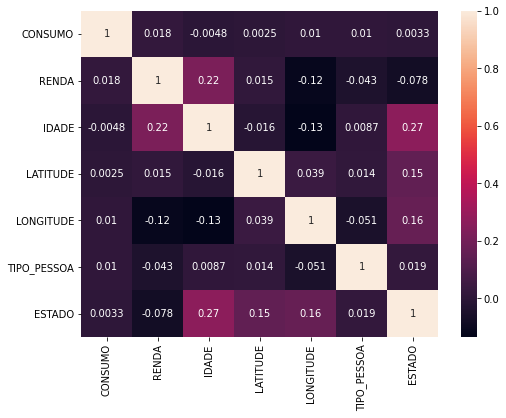

In [43]:
corr_df = df_teste.corr(method='pearson')
plt.figure(figsize=(8, 6))
sns.heatmap(corr_df, annot=True)
plt.show()

In [92]:
data=df[['CONSUMO','RENDA','IDADE']]

In [93]:
data

,CONSUMO,RENDA,IDADE
0,17,0,19
1,5,1,22
2,17,1,46
3,11,2,25
4,11,2,43
...,...,...,...
9994,20,0,22
9995,20,0,21
9996,17,1,20
9997,17,2,24


In [94]:
data['CONSUMO'] = data['CONSUMO'].astype('category')
consumo = dict(enumerate(data['CONSUMO'].cat.categories))
data['CONSUMO_codes'] = data['CONSUMO'].cat.codes
data['CONSUMO_reversed'] = data['CONSUMO_codes'].map(consumo)

<ipython-input-94-1a6f4d22a6b2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['CONSUMO'] = data['CONSUMO'].astype('category')
<ipython-input-94-1a6f4d22a6b2>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['CONSUMO_codes'] = data['CONSUMO'].cat.codes
<ipython-input-94-1a6f4d22a6b2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

In [95]:
data.head()

,CONSUMO,RENDA,IDADE,CONSUMO_codes,CONSUMO_reversed
0,17,0,19,17,17
1,5,1,22,5,5
2,17,1,46,17,17
3,11,2,25,11,11
4,11,2,43,11,11


In [90]:
corr = data.corr()
corr.style.background_gradient(cmap='coolwarm')

,RENDA,IDADE,customer_city_codes,customer_city_reversed,CONSUMO_codes,CONSUMO_reversed
RENDA,1.000000,0.224189,0.018350,0.018350,0.018350,0.018350
IDADE,0.224189,1.000000,-0.004797,-0.004797,-0.004797,-0.004797
customer_city_codes,0.018350,-0.004797,1.000000,1.000000,1.000000,1.000000
customer_city_reversed,0.018350,-0.004797,1.000000,1.000000,1.000000,1.000000
CONSUMO_codes,0.018350,-0.004797,1.000000,1.000000,1.000000,1.000000
CONSUMO_reversed,0.018350,-0.004797,1.000000,1.000000,1.000000,1.000000


In [96]:
data.columns

Index(['CONSUMO', 'RENDA', 'IDADE', 'CONSUMO_codes', 'CONSUMO_reversed'], dtype='object')

In [97]:
df_seg = data[['CONSUMO', 'RENDA', 'CONSUMO_codes']]
df_seg.head(2)

,CONSUMO,RENDA,CONSUMO_codes
0,17,0,17
1,5,1,5


In [99]:
df_seg.dropna(inplace=True)
df_seg.isnull().sum()

<ipython-input-99-d11ae2a14f60>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_seg.dropna(inplace=True)


CONSUMO          0
RENDA            0
CONSUMO_codes    0
dtype: int64

In [98]:
df_seg.to_csv('list_segmentado.csv', index=False)

In [100]:
#Normalização com média 0 e desvio 1
normaliza = MinMaxScaler()

In [101]:
#Aplica a normalização
X_std = normaliza.fit_transform(df_seg)

In [44]:
df_norma=df[['CONSUMO','RENDA','IDADE']]
df_norma.dtypes

CONSUMO    int32
RENDA      int32
IDADE      int64
dtype: object

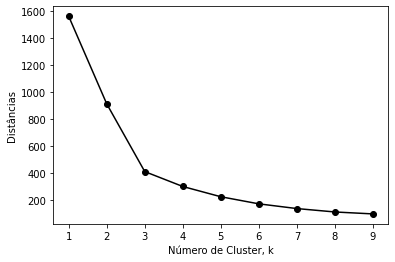

In [102]:
#aplicando a curva do cotovelo para encontrar o número de clusters
ks = range(1,10)
inertias = []
for k in ks:
    #cria o objeto para modelo k-means para os testes
    model = KMeans(n_clusters=k)
    
    #aplica nos componentes selecionados
    model.fit(X_std)
    
    #adiciona os valores para a distância (agitação)
    inertias.append(model.inertia_)
    

plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('Número de Cluster, k')
plt.ylabel('Distâncias')
plt.xticks(ks)
plt.show()

In [103]:
#transformando os dados normalizados em um dataframe
df_norma = pd.DataFrame(X_std, columns=['CONSUMO', 'RENDA', 'CONSUMO_codes'])

In [104]:
df_norma.to_csv('list_normalizado.csv', index=False)

In [105]:
#Agora todos os valores estão entre 0 e 1
df_norma.head(2)

,CONSUMO,RENDA,CONSUMO_codes
0,0.809524,0.000000,0.809524
1,0.238095,0.333333,0.238095


In [106]:
#Realizando a aplicação do Kmeans
km = KMeans(n_clusters=4)
clusters = km.fit_predict(df_norma)
df_norma['cluster'] = clusters
df_norma.head()

,CONSUMO,RENDA,CONSUMO_codes,cluster
0,0.809524,0.000000,0.809524,1
1,0.238095,0.333333,0.238095,2
2,0.809524,0.333333,0.809524,0
3,0.523810,0.666667,0.523810,3
4,0.523810,0.666667,0.523810,3


In [107]:
#retornando os dados
retorno = normaliza.inverse_transform(X_std)

In [108]:
retorno

array([[17.,  0., 17.],
       [ 5.,  1.,  5.],
       [17.,  1., 17.],
       ...,
       [17.,  1., 17.],
       [17.,  2., 17.],
       [ 2.,  1.,  2.]])

In [109]:
df_retorno = pd.DataFrame(retorno, columns=['CONSUMO', 'RENDA', 'CONSUMO_codes'])
df_retorno['cluster'] = clusters
df_retorno.head()

,CONSUMO,RENDA,CONSUMO_codes,cluster
0,17.0,0.0,17.0,1
1,5.0,1.0,5.0,2
2,17.0,1.0,17.0,0
3,11.0,2.0,11.0,3
4,11.0,2.0,11.0,3


In [110]:
df_retorno.to_csv('list_clusters.csv', index=False)

In [111]:
cluster_0 = df_retorno[df_retorno['cluster'] == 0]
cluster_1 = df_retorno[df_retorno['cluster'] == 1]
cluster_2 = df_retorno[df_retorno['cluster'] == 2]
cluster_3 = df_retorno[df_retorno['cluster'] == 3]

In [112]:
cluster_2 = cluster_2.astype('int8')
cluster_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 864 entries, 1 to 8742
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   CONSUMO        864 non-null    int8 
 1   RENDA          864 non-null    int8 
 2   CONSUMO_codes  864 non-null    int8 
 3   cluster        864 non-null    int8 
dtypes: int8(4)
memory usage: 10.1 KB


In [113]:
cluster_1['CONSUMO_codes_reversed'] = cluster_1['CONSUMO_codes'].map(consumo)

<ipython-input-113-72b4ef5e0290>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_1['CONSUMO_codes_reversed'] = cluster_1['CONSUMO_codes'].map(consumo)


In [115]:
df.columns

Index(['ID_USUARIO', 'DATA_NASCIMENTO', 'RENDA', 'RENDA_FIXA', 'LATITUDE',
       'LONGITUDE', 'TIPO_PESSOA', 'CIDADE', 'ESTADO', 'LOGRADOURO', 'ANO',
       'IDADE', 'FAIXA ETARIA', 'CONSUMO'],
      dtype='object')

In [116]:
ind_list = list(cluster_1.index)
cluster1_original = df.iloc[ind_list]

In [ ]:
cluster1_original

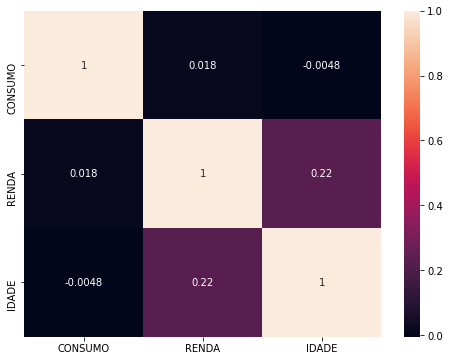

In [45]:
corr_df = df_norma.corr(method='pearson')
plt.figure(figsize=(8, 6))
sns.heatmap(corr_df, annot=True)
plt.show()

In [46]:
# Elimina as linhas que possuem dados faltantes
df_norma.dropna(inplace=True)
df_norma.isnull().sum()

<ipython-input-46-85a26607c065>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_norma.dropna(inplace=True)


CONSUMO    0
RENDA      0
IDADE      0
dtype: int64

In [47]:
#Normalização com média 0 e desvio 1
normaliza = MinMaxScaler()

In [48]:
#Aplica a normalização
X_std = normaliza.fit_transform(df_norma)
X_std

array([[0.80952381, 0.        , 0.20879121],
       [0.23809524, 0.33333333, 0.24175824],
       [0.80952381, 0.33333333, 0.50549451],
       ...,
       [0.80952381, 0.33333333, 0.21978022],
       [0.80952381, 0.66666667, 0.26373626],
       [0.0952381 , 0.33333333, 0.20879121]])

In [49]:
# Cálculo do WCSSE - Within Cluster Sum of Squared Errors
wcsse = []
maxclusters = 11
for i in range(1, maxclusters):
    kmeans = KMeans(n_clusters = i, init = 'random')
    kmeans.fit(df_norma)
    print (i,kmeans.inertia_)
    wcsse.append(kmeans.inertia_)

1 2358141.1266155844
2 832570.1551245196
3 500757.9457050283
4 376739.5974928032
5 301603.37726850354
6 250398.05556625352
7 204838.05291200924
8 178918.99063571784
9 157044.17450836356
10 138935.26074982053


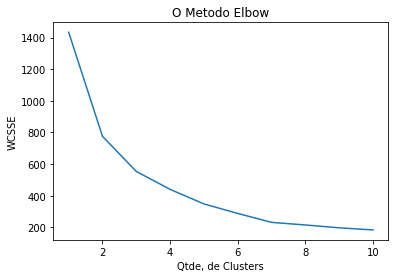

In [155]:
# Plotagem do Gráfico para visualização do "cotovelo" - Método de Elbow
# Ao final do Estudo do Metodo de Elbow a seguir, foram gerados 11 clusters
plt.plot(range(1, maxclusters), wcsse)
plt.title('O Metodo Elbow')
plt.xlabel('Qtde, de Clusters')
plt.ylabel('WCSSE') # Within Cluster Sum of Squares
plt.show()

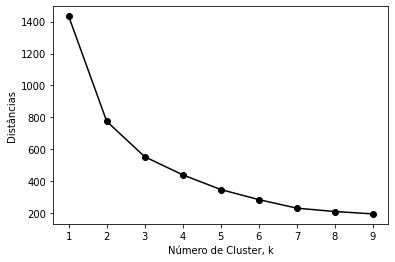

In [50]:
#aplicando a curva do cotovelo para encontrar o número de clusters
ks = range(1,10)
inertias = []
for k in ks:
    #cria o objeto para modelo k-means para os testes
    model = KMeans(n_clusters=k)
    
    #aplica nos componentes selecionados
    model.fit(X_std)
    
    #adiciona os valores para a distância (agitação)
    inertias.append(model.inertia_)
    

plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('Número de Cluster, k')
plt.ylabel('Distâncias')
plt.xticks(ks)
plt.show()

In [51]:
#transformando os dados normalizados em um dataframe
df_norma = pd.DataFrame(X_std, columns=['CONSUMO','RENDA','IDADE'])

In [60]:
df_norma.to_csv('list_normalizado.csv', index=False)

In [52]:
#Agora todos os valores estão entre 0 e 1
df_norma.head(2)

,CONSUMO,RENDA,IDADE
0,0.809524,0.000000,0.208791
1,0.238095,0.333333,0.241758


In [53]:
from sklearn.cluster import KMeans

In [86]:
#Realizando a aplicação do Kmeans- cria a variavel cluster
km = KMeans(n_clusters=4)
clusters = km.fit_predict(df_norma)
df_norma['cluster'] = clusters
df_norma.head()

,CONSUMO,RENDA,IDADE,cluster
0,0.809524,0.000000,0.208791,0
1,0.238095,0.333333,0.241758,2
2,0.809524,0.333333,0.505495,3
3,0.523810,0.666667,0.274725,1
4,0.523810,0.666667,0.472527,1


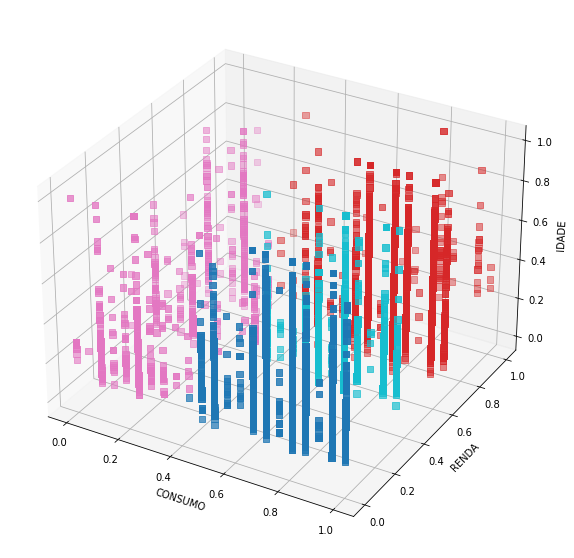

In [87]:
#plota o gráfico de dispersão
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')

x = df_norma['CONSUMO']
y = df_norma['RENDA']
z = df_norma['IDADE']

ax.scatter(x, y, z, marker='s', c=df_norma['cluster'], s=40, cmap='tab10')

plt.xlabel('CONSUMO')
plt.ylabel('RENDA')
ax.set_zlabel('IDADE')

plt.show()

In [88]:
#retornando os dados
retorno = normaliza.inverse_transform(X_std)

In [89]:
#nomeia os cluster
df_retorno = pd.DataFrame(retorno, columns=['CONSUMO','RENDA','IDADE'])
df_retorno['cluster'] = clusters
df_retorno.head()

,CONSUMO,RENDA,IDADE,cluster
0,17.0,0.0,19.0,0
1,5.0,1.0,22.0,2
2,17.0,1.0,46.0,3
3,11.0,2.0,25.0,1
4,11.0,2.0,43.0,1


In [61]:
df_retorno.to_csv('list_clusters.csv', index=False)

In [62]:
cluster_0 = df_retorno[df_retorno['cluster'] == 0]
cluster_1 = df_retorno[df_retorno['cluster'] == 1]
cluster_2 = df_retorno[df_retorno['cluster'] == 2]
cluster_3 = df_retorno[df_retorno['cluster'] == 3]

In [85]:
cluster_1['CONSUMO_codes_reversed'] = cluster_1['CONSUMO_city_codes'].map(consumo)

KeyError: 'CONSUMO_city_codes'

In [63]:
cluster_2 = cluster_2.astype('int8')
cluster_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3776 entries, 0 to 8739
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   CONSUMO  3776 non-null   int8 
 1   RENDA    3776 non-null   int8 
 2   IDADE    3776 non-null   int8 
 3   cluster  3776 non-null   int8 
dtypes: int8(4)
memory usage: 44.2 KB


In [64]:
df_retorno.dtypes

CONSUMO    int8
RENDA      int8
IDADE      int8
cluster    int8
dtype: object